## Unsupervised Color-Based Segmentation

### Setup

#### Installs and Imports

In [ ]:
%pip install scikit-image

In [ ]:
import os
import cv2
import json
import numpy as np
import tensorflow as tf
import scipy.ndimage as nd
import matplotlib.pyplot as plt

from glob import glob
from random import randint
from matplotlib.gridspec import GridSpec
from sklearn.mixture import GaussianMixture
from sklearn.preprocessing import LabelEncoder
from skimage.filters import threshold_multiotsu

#### Helper Functions

In [ ]:
def custom_plotter(
    ax=None,
    subplot_idx=None,
    img=None,
    xlabel=None,
    ylabel=None,
    set_legend=False,
    title=None,
    set_ticks=True,
    plt_args=[],
    plt_kwargs={},
    imshow_kwargs={},
):
    if ax is None:
        if subplot_idx is not None:
            ax = plt.subplot(subplot_idx)
        else:
            ax = plt.gca()
    ax.plot(*plt_args, **plt_kwargs)
    if img is not None:
        ax.imshow(img, **imshow_kwargs)
    # ax.set(xlabel=xlabel, ylabel=ylabel, title=title)
    ax.set_xlabel(xlabel, size=17)
    ax.set_title(title, size=17)
    if set_ticks == False:
        ax.set(xticks=[], yticks=[])
    if set_legend == True:
        ax.legend()
    return ax


def ComputeIoU(pred_mask, true_mask):

    # convert to one channel
    pred_1chnl = np.sum(pred_mask, axis=-1) if len(pred_mask.shape) == 3 else pred_mask
    true_1chnl = np.sum(true_mask, axis=-1) if len(true_mask.shape) == 3 else true_mask

    # encode the unique label values of a flat array to 0,...,n_class-1
    encoder = LabelEncoder()

    true_flat = true_1chnl.reshape((-1))
    true_encoded = encoder.fit_transform(true_flat)
    true_encoded = true_encoded.reshape(true_1chnl.shape)

    cls_lbl = encoder.classes_  #

    pred_flat = pred_1chnl.reshape((-1))
    pred_encoded = encoder.fit_transform(pred_flat)
    pred_encoded = pred_encoded.reshape(pred_1chnl.shape)

    iou = []
    for value in np.unique(true_encoded):
        true_binarized = np.where(true_encoded == value, 1, 0)
        pred_binarized = np.where(pred_encoded == value, 1, 0)

        intersection = np.sum(np.multiply(true_binarized, pred_binarized))
        union = np.sum(pred_binarized) + np.sum(true_binarized) - intersection
        iou.append(intersection / union)

    return list(cls_lbl), iou


def MaskEncoder(mask):
    mask_1chnl = np.sum(mask, axis=-1) if len(mask.shape) == 3 else mask
    mask_1chnl[mask_1chnl == 176] = 1
    mask_1chnl[mask_1chnl == 255] = 2
    return np.uint8(mask_1chnl)


def MorphClose(img):
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (15, 15))
    return cv2.morphologyEx(img, cv2.MORPH_CLOSE, kernel)

#### Initialize Variables

In [ ]:
root_dir = "../data/external"
img_path_list = glob(os.path.join(root_dir, "images/**/*.jpg"))
mask_path_list = [
    path.replace("images", "annotations").replace(".jpg", "_mask.png")
    for path in img_path_list
]

In [ ]:
idx = randint(0, len(img_path_list))
idx = 106

img = cv2.imread(img_path_list[idx])
mask = cv2.imread(mask_path_list[idx])
mask = cv2.cvtColor(mask, cv2.COLOR_BGR2RGB)

rgb_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
hsv_img = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
hls_img = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)
lab_img = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)

a_chnl = lab_img[:, :, 1]
b_chnl = lab_img[:, :, 2]
satur_chnl = hsv_img[:, :, 1]
blue_chnl = rgb_img[:, :, 2]

# print(idx)

### Visualizing the Image

#### Image in Different Color Spaces

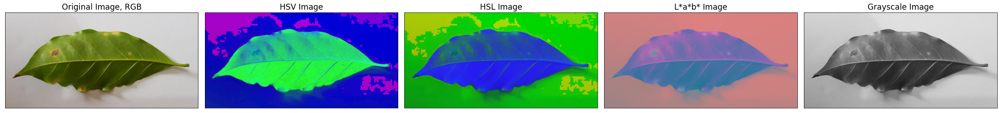

In [ ]:
plt_idx = np.arange(5) + 151
img_list = [rgb_img, hsv_img, hls_img, lab_img, gray_img]
titles = [
    "Original Image, RGB",
    "HSV Image",
    "HSL Image",
    "L*a*b* Image",
    "Grayscale Image",
]

plt.figure(figsize=(30, 20))
for idx, img, title in zip(plt_idx, img_list, titles):
    if title == "Grayscale Image":
        custom_plotter(
            subplot_idx=idx,
            img=img,
            title=title,
            set_ticks=False,
            imshow_kwargs={"cmap": "gray"},
        )
        continue
    custom_plotter(subplot_idx=idx, img=img, title=title, set_ticks=False)
plt.tight_layout()

#### Image in Different Channels

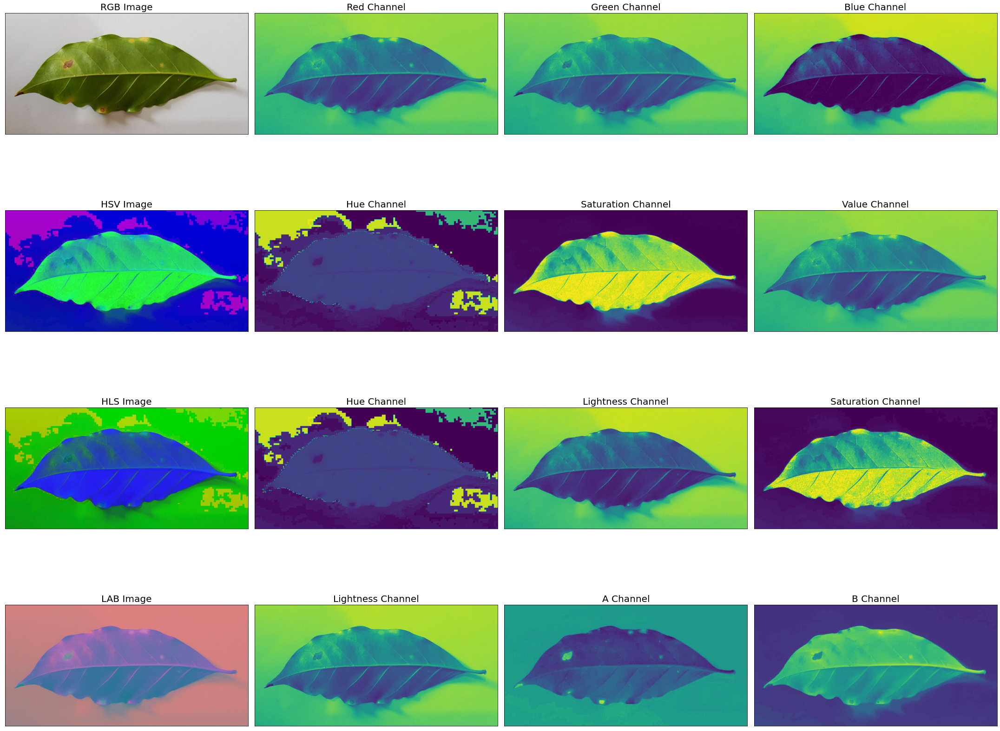

In [ ]:
titles = [
    ["RGB Image", "Red Channel", "Green Channel", "Blue Channel"],
    ["HSV Image", "Hue Channel", "Saturation Channel", "Value Channel"],
    ["HLS Image", "Hue Channel", "Lightness Channel", "Saturation Channel"],
    ["LAB Image", "Lightness Channel", "A Channel", "B Channel"],
]

img_list = [rgb_img, hsv_img, hls_img, lab_img]
channel_ids = np.arange(3)

_, ax = plt.subplots(
    nrows=4, ncols=4, subplot_kw={"xticks": [], "yticks": []}, figsize=(30, 25)
)
for i, img in enumerate(img_list):
    for j in range(4):
        if j == 0:
            ax[i, j].imshow(img)
            ax[i, j].set_title(titles[i][j], size=20)
            continue

        ax[i, j].imshow(img[:, :, j - 1])
        ax[i, j].set_title(titles[i][j], size=20)

plt.tight_layout()

#### Image Histograms

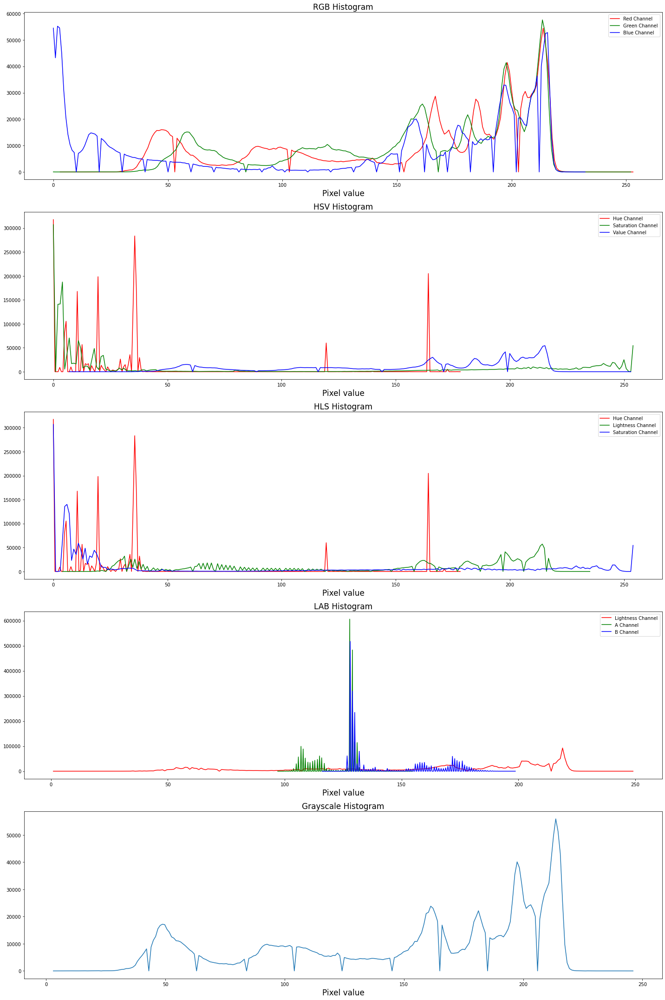

In [ ]:
img_list = [rgb_img, hsv_img, hls_img, lab_img, gray_img]
titles = [
    "RGB Histogram",
    "HSV Histogram",
    "HLS Histogram",
    "LAB Histogram",
    "Grayscale Histogram",
]
labels = [
    ["Red Channel", "Green Channel", "Blue Channel"],
    ["Hue Channel", "Saturation Channel", "Value Channel"],
    ["Hue Channel", "Lightness Channel", "Saturation Channel"],
    ["Lightness Channel", "A Channel", "B Channel"],
]

colors = ["red", "green", "blue"]
channel_ids = np.arange(3)
plt_idx_list = np.arange(5) + 511

plt.figure(figsize=(20, 30))
for i, (img, idx, title) in enumerate(zip(img_list, plt_idx_list, titles)):

    if i == 4:
        hist, bin_edges = np.histogram(img, bins=256, range=(img.min(), img.max()))
        custom_plotter(
            plt_args=[bin_edges[:-1], hist],
            subplot_idx=idx,
            xlabel="Pixel value",
            ylabel="Pixel count",
            title=title,
        )
        continue

    for j, (channel_id, c) in enumerate(zip(channel_ids, colors)):
        hist, bin_edges = np.histogram(
            img[:, :, channel_id],
            bins=256,
            range=(img[:, :, channel_id].min(), img[:, :, channel_id].max()),
        )
        custom_plotter(
            subplot_idx=idx,
            xlabel="Pixel value",
            ylabel="Pixel count",
            title=title,
            set_legend=True,
            plt_args=[bin_edges[:-1], hist],
            plt_kwargs={"color": f"{c}", "label": f"{labels[i][j]}"},
        )

plt.tight_layout()

#### Comparing A-Channel of the LAB Image with the Mask

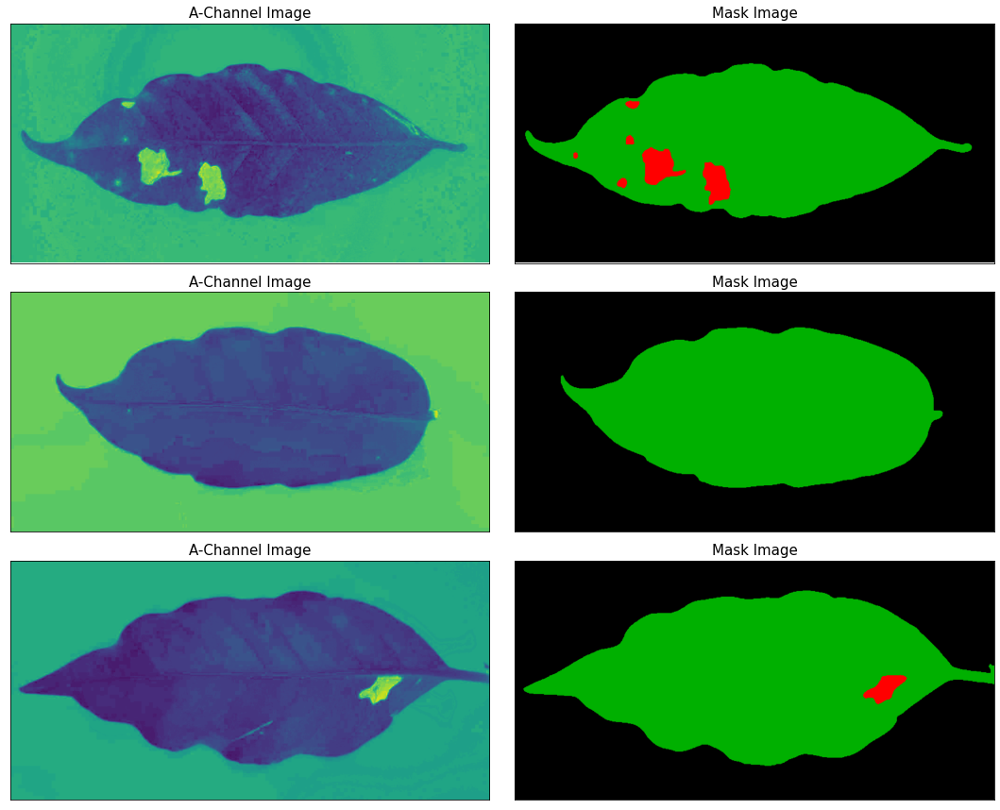

In [ ]:
_, ax = plt.subplots(
    nrows=3, ncols=2, subplot_kw={"xticks": [], "yticks": []}, figsize=(15, 12)
)
titles = ["A-Channel Image", "Mask Image"]
for i in range(3):
    idx = randint(0, len(img_path_list))

    for (
        j,
        title,
    ) in enumerate(titles):
        img_ = cv2.imread(img_path_list[idx])
        mask_ = cv2.imread(mask_path_list[idx])

        mask_ = cv2.cvtColor(mask_, cv2.COLOR_BGR2RGB)
        lab_img_ = cv2.cvtColor(img_, cv2.COLOR_BGR2LAB)
        if j == 0:
            ax[i, j].imshow(lab_img_[:, :, 1])
            ax[i, j].set_title(title, size=15)
            continue

        ax[i, j].imshow(mask_)
        ax[i, j].set_title(title, size=15)
plt.tight_layout()
plt.show()

### Foreground Segmentation Using Otsu Thresholding


<AxesSubplot:title={'center':'Full Leaf'}>

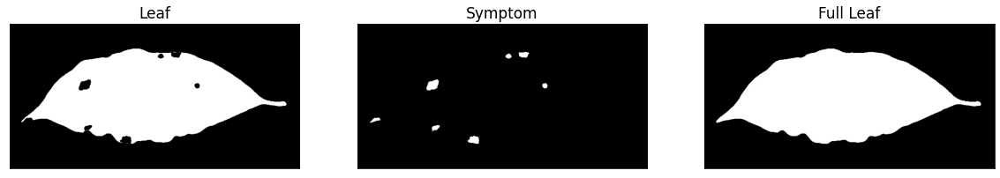

In [ ]:
with open("../data/external/annotations-info.json") as f:
    annotation_info = json.load(f)

symptom = cv2.inRange(
    mask, np.array(annotation_info["background"]), np.array(annotation_info["leaf"])
)
leaf = cv2.inRange(
    mask, np.array(annotation_info["background"]), np.array(annotation_info["symptom"])
)
full_leaf = cv2.bitwise_not(cv2.bitwise_and(leaf, symptom))
full_leaf[full_leaf == 255] = 1

fig = plt.figure(figsize=(20, 15))
custom_plotter(
    subplot_idx=131,
    img=cv2.bitwise_not(leaf),
    title="Leaf",
    set_ticks=False,
    imshow_kwargs={"cmap": "gray"},
)
custom_plotter(
    subplot_idx=132,
    img=cv2.bitwise_not(symptom),
    title="Symptom",
    set_ticks=False,
    imshow_kwargs={"cmap": "gray"},
)
custom_plotter(
    subplot_idx=133,
    img=full_leaf,
    title="Full Leaf",
    set_ticks=False,
    imshow_kwargs={"cmap": "gray"},
)

In [ ]:
def Otsu(rgb_img, true_mask):
    blue_chnl = rgb_img[:, :, 2]
    satur_chnl = cv2.cvtColor(rgb_img, cv2.COLOR_RGB2HSV)[:, :, 1]
    b_chnl = cv2.cvtColor(rgb_img, cv2.COLOR_RGB2LAB)[:, :, 2]

    _, b_thresh = cv2.threshold(b_chnl, 0, 1, cv2.THRESH_BINARY | cv2.THRESH_OTSU)
    _, satur_thresh = cv2.threshold(
        satur_chnl, 0, 1, cv2.THRESH_BINARY | cv2.THRESH_OTSU
    )
    _, blue_thresh = cv2.threshold(
        blue_chnl, 0, 1, cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU
    )

    # The blue channel can have a spill effect as it confuses the dark shadow with the leaf. The saturation channel,
    # in contrast, have a sharp edged leaf, but have holes on the leaf region.
    # We can mitigate this issue by finding the spilling region using XOR operation between the two channels.

    spill_mask = cv2.bitwise_not(
        cv2.bitwise_xor(satur_thresh, blue_thresh)
    )  # returns spill regions with values 254 and 255(due to bitwise_not)

    encoder = LabelEncoder()  # encode values 254 and 255 to 0 and 1
    spill_mask_flat = spill_mask.reshape((-1))
    spill_mask_encoded = encoder.fit_transform(spill_mask_flat)
    spill_mask = np.uint8(spill_mask_encoded.reshape(spill_mask.shape))

    masked_blue = cv2.bitwise_and(
        blue_thresh, blue_thresh, mask=spill_mask
    )  # Blue masking: remove the spill in the bg due to the shadow
    mask = cv2.bitwise_or(
        masked_blue, b_thresh
    )  # Hole filling, less hole in the b* channel
    mask = MorphClose(mask)

    _, iou_segment = ComputeIoU(
        mask, true_mask
    )  # returns [cls_lbl], [bg iou, leaf iou]
    _, iou_blue = ComputeIoU(MorphClose(blue_thresh), true_mask)

    # the blue thresh img works well for most cases, but for the some img with shadowy bg. We let the iou decide which segmentation mask to choose.
    segmented_mask = (
        mask if iou_segment[1] > iou_blue[1] else MorphClose(blue_thresh)
    )  # leaf iou is used for comparison
    return segmented_mask

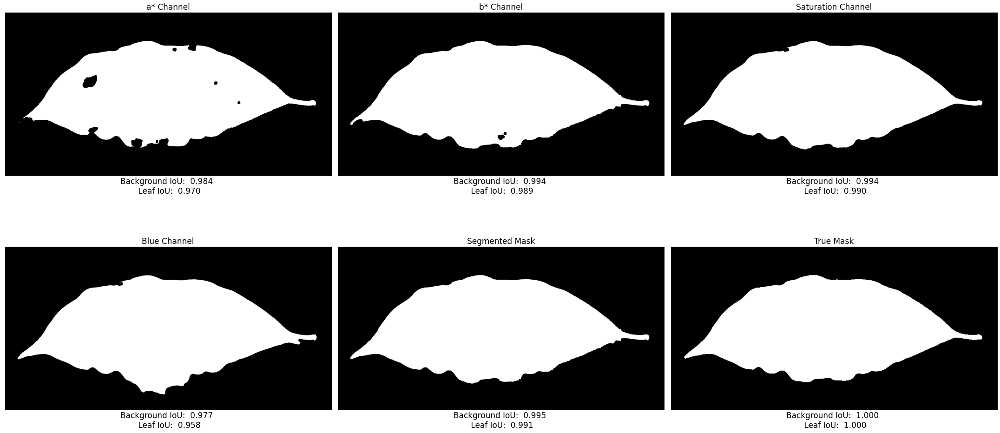

In [ ]:
_, a_thresh = cv2.threshold(a_chnl, 0, 1, cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)
_, b_thresh = cv2.threshold(b_chnl, 0, 1, cv2.THRESH_BINARY | cv2.THRESH_OTSU)
_, satur_thresh = cv2.threshold(satur_chnl, 0, 1, cv2.THRESH_BINARY | cv2.THRESH_OTSU)
_, blue_thresh = cv2.threshold(blue_chnl, 0, 1, cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)

closed_imgs = [
    MorphClose(img) for img in [a_thresh, b_thresh, satur_thresh, blue_thresh]
]

imgs = iter([*closed_imgs, Otsu(rgb_img, mask), full_leaf])
titles = iter(
    [
        "a* Channel",
        "b* Channel",
        "Saturation Channel",
        "Blue Channel",
        "Segmented Mask",
        "True Mask",
    ]
)
iou_ = iter([])

fig = plt.figure(figsize=(30, 15))
gs = GridSpec(nrows=2, ncols=3)
for row in range(2):
    for clmn in range(3):
        ax = fig.add_subplot(gs[row, clmn])
        img, title = next(imgs), next(titles)

        _, iou = ComputeIoU(img, full_leaf)
        label = f"Background IoU: {iou[0]: .3f} \n Leaf IoU: {iou[1]: .3f}"
        custom_plotter(
            ax=ax,
            img=img,
            title=title,
            set_ticks=False,
            xlabel=label,
            imshow_kwargs={"cmap": "gray"},
        )

gs.tight_layout(fig)

#### Visualizing Misclassified Segmentation Result

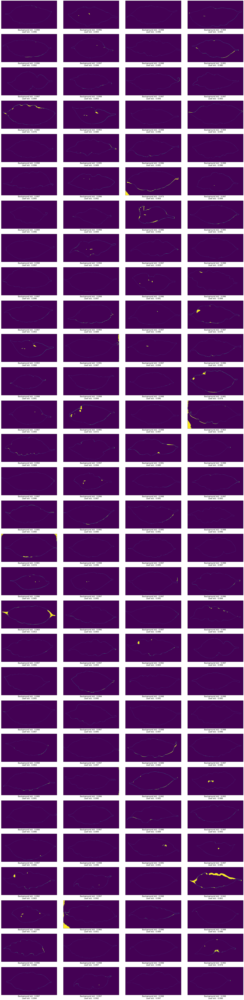

In [ ]:
fig = plt.figure(figsize=(30, 120))
gs = GridSpec(nrows=30, ncols=4)
for row in range(30):
    for clmn in range(4):
        idx = randint(0, len(img_path_list))
        _img = cv2.imread(img_path_list[idx])
        _mask = cv2.imread(mask_path_list[idx])
        _rgb_img = cv2.cvtColor(_img, cv2.COLOR_BGR2RGB)

        _segmented_img = Otsu(_rgb_img, _mask)

        _leaf = cv2.inRange(
            _mask,
            np.array(annotation_info["background"]),
            np.array(annotation_info["leaf"]),
        )
        _symptom = cv2.inRange(
            _mask,
            np.array(annotation_info["background"]),
            np.array(annotation_info["symptom"]),
        )
        _full_leaf = cv2.bitwise_not(cv2.bitwise_and(_leaf, _symptom))
        _full_leaf[_full_leaf == 255] = 1

        _misclassified_img = cv2.bitwise_xor(_segmented_img, _full_leaf)

        _, iou = ComputeIoU(_segmented_img, _full_leaf)

        ax = fig.add_subplot(gs[row, clmn])
        ax.imshow(_misclassified_img)
        ax.set_xlabel(
            f"Background IoU: {iou[0]: .3f} \n Leaf IoU: {iou[1]: .3f}", size=16
        )
        ax.set(xticks=[], yticks=[])

gs.tight_layout(fig)

### Masked a* Channel

<AxesSubplot:title={'center':'Masked a* Channel'}>

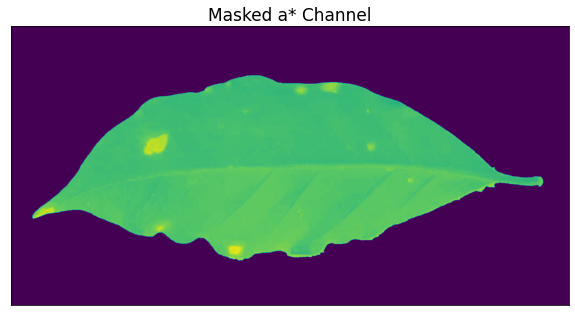

In [ ]:
def a_MaskGenerator(rgb_img, mask):
    a_chnl = cv2.cvtColor(rgb_img, cv2.COLOR_RGB2LAB)[:, :, 1]
    a_mask = Otsu(rgb_img, mask)
    a_masked = cv2.bitwise_and(a_chnl, a_chnl, mask=a_mask)
    return a_masked


plt.figure(figsize=(10, 7.5))
custom_plotter(
    img=a_MaskGenerator(rgb_img, mask), title="Masked a* Channel", set_ticks=False
)

### Segmentation Using Multi-Otsu Thresholding

In [ ]:
def MultiOtsu(img, mask, return_encoded=True, return_misclassified=True):
    thresholds = threshold_multiotsu(
        img
    )  # find the two threshold values to segment the image into three regions(background, leaf, and the symptom)
    segmented_img = np.digitize(img, bins=thresholds)  # generate the three regions
    segmented_img = np.uint8(segmented_img)

    if return_encoded:
        for i, value in enumerate(np.unique(segmented_img)):
            segmented_img[segmented_img == value] = i

    if return_misclassified:
        mask_1chnl = MaskEncoder(mask)
        misclassified = cv2.bitwise_xor(segmented_img, mask_1chnl)
        return segmented_img, misclassified
    return segmented_img

<AxesSubplot:title={'center':'Misclassified'}, xlabel='Background IoU:  0.995 \n Leaf IoU:  0.529 \n Symptom IoU:   0.042'>

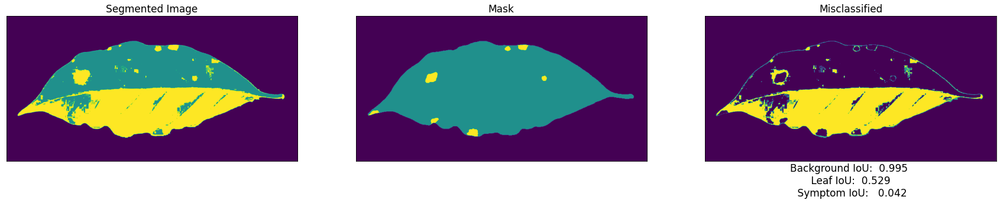

In [ ]:
a_masked_img = a_MaskGenerator(rgb_img, mask)
segmented_img, misclassified = MultiOtsu(a_masked_img, mask)
mask_1chnl = MaskEncoder(mask)

_, iou = ComputeIoU(segmented_img, mask_1chnl)
label = (
    f"Background IoU: {iou[0]: .3f} \n Leaf IoU: {iou[1]: .3f} \n Symptom IoU:  {iou[2]: .3f}"
    if len(iou) == 3
    else f"Background IoU: {iou[0]: .3f} \n Leaf IoU: {iou[1]: .3f}"
)

plt.figure(figsize=(30, 20))
custom_plotter(
    subplot_idx=131, img=segmented_img, title="Segmented Image", set_ticks=False
)
custom_plotter(subplot_idx=132, img=mask_1chnl, title="Mask", set_ticks=False)
custom_plotter(
    subplot_idx=133,
    img=misclassified,
    title="Misclassified",
    xlabel=label,
    set_ticks=False,
)

# plt.tight_layout()

#### Visualizing Misclassified Segmentation Result

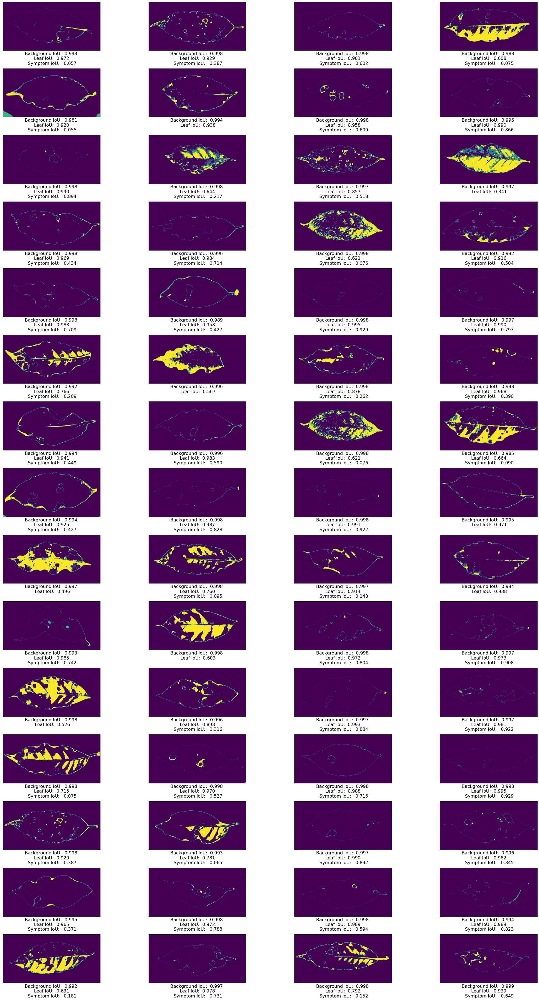

In [ ]:
fig = plt.figure(figsize=(30, 50))
gs = GridSpec(nrows=15, ncols=4)

for row in range(15):
    for clmn in range(4):
        _idx = randint(0, len(img_path_list))
        _img = cv2.imread(img_path_list[_idx])
        _mask = cv2.imread(mask_path_list[_idx])

        _a_masked_img = a_MaskGenerator(cv2.cvtColor(_img, cv2.COLOR_BGR2RGB), _mask)
        _segmented_img, _misclassified_img = MultiOtsu(_a_masked_img, _mask)

        _, iou = ComputeIoU(_segmented_img, _mask)
        label = (
            f"Background IoU: {iou[0]: .3f} \n Leaf IoU: {iou[1]: .3f} \n Symptom IoU:  {iou[2]: .3f}"
            if len(iou) == 3
            else f"Background IoU: {iou[0]: .3f} \n Leaf IoU: {iou[1]: .3f}"
        )

        ax = fig.add_subplot(gs[row, clmn])
        ax.imshow(_misclassified_img)
        ax.set_xlabel(label, size=16)
        ax.set(xticks=[], yticks=[])

gs.tight_layout(fig)

### Segmentation Using K-Means

In [ ]:
def KMeans(img, mask, return_encoded=True, return_misclassified=True):
    compactness, labels, centers = cv2.kmeans(
        data=np.reshape(np.float32(img), (-1)),
        K=3,
        bestLabels=None,
        criteria=(cv2.TERM_CRITERIA_MAX_ITER + cv2.TERM_CRITERIA_EPS, 100, 1.0),
        attempts=12,
        flags=cv2.KMEANS_RANDOM_CENTERS,
    )
    centers = np.uint8(centers)
    segmented_data = centers[labels.flatten()]
    segmented_img = segmented_data.reshape((a_masked_img.shape))

    if return_encoded:  # Encodes to 0, 1, [2]
        for i, value in enumerate(np.unique(segmented_img)):
            segmented_img[segmented_img == value] = i

    if return_misclassified:
        mask_1chnl = MaskEncoder(mask)
        misclassified = cv2.bitwise_xor(segmented_img, mask_1chnl)
        return segmented_img, misclassified
    return segmented_img

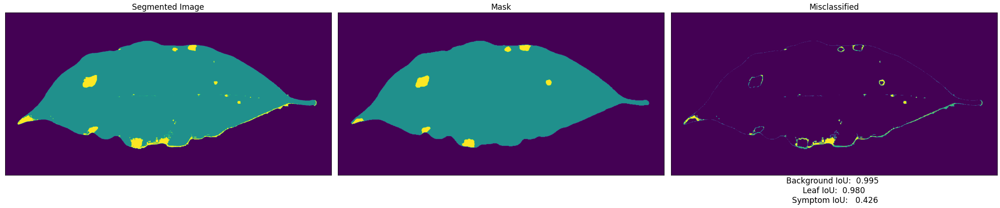

In [ ]:
a_masked_img = a_MaskGenerator(rgb_img, mask)
segmented_img, misclassified = KMeans(a_masked_img, mask)
mask_1chnl = MaskEncoder(mask)

_, iou = ComputeIoU(segmented_img, mask_1chnl)
label = (
    f"Background IoU: {iou[0]: .3f} \n Leaf IoU: {iou[1]: .3f} \n Symptom IoU:  {iou[2]: .3f}"
    if len(iou) == 3
    else f"Background IoU: {iou[0]: .3f} \n Leaf IoU: {iou[1]: .3f}"
)

plt.figure(figsize=(30, 20))
custom_plotter(
    subplot_idx=131, img=segmented_img, title="Segmented Image", set_ticks=False
)
custom_plotter(subplot_idx=132, img=mask_1chnl, title="Mask", set_ticks=False)
custom_plotter(
    subplot_idx=133,
    img=misclassified,
    title="Misclassified",
    xlabel=label,
    set_ticks=False,
)

plt.tight_layout()

#### Visualizing Misclassified Segmentation Result

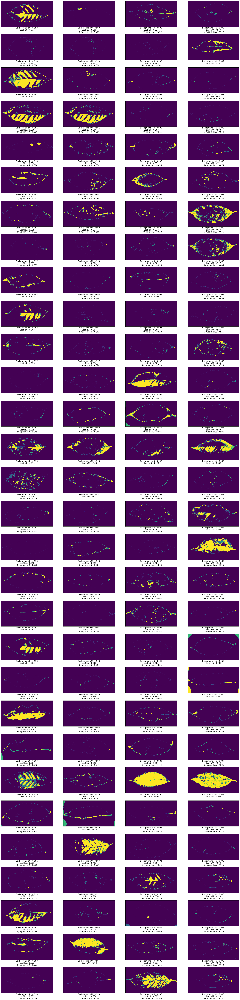

In [ ]:
fig = plt.figure(figsize=(30, 120))
gs = GridSpec(nrows=30, ncols=4)
for row in range(30):
    for clmn in range(4):
        _idx = randint(0, len(img_path_list))

        _img = cv2.imread(img_path_list[_idx])
        _mask = cv2.imread(mask_path_list[_idx])

        _a_masked_img = a_MaskGenerator(cv2.cvtColor(_img, cv2.COLOR_BGR2RGB), _mask)
        _segmented_img, _misclassified_img = KMeans(_a_masked_img, _mask)

        _, iou = ComputeIoU(_segmented_img, _mask)
        label = (
            f"Background IoU: {iou[0]: .3f} \n Leaf IoU: {iou[1]: .3f} \n Symptom IoU:  {iou[2]: .3f}"
            if len(iou) == 3
            else f"Background IoU: {iou[0]: .3f} \n Leaf IoU: {iou[1]: .3f}"
        )

        ax = fig.add_subplot(gs[row, clmn])
        ax.imshow(_misclassified_img)
        ax.set_xlabel(label, size=16)
        ax.set(xticks=[], yticks=[])
gs.tight_layout(fig)

### Best Segmentation Results

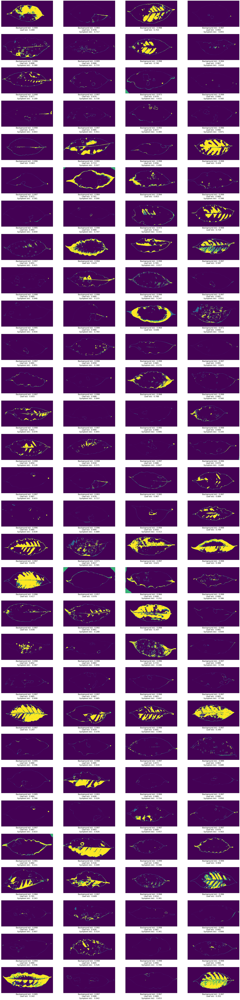

In [ ]:
fig = plt.figure(figsize=(30, 120))
gs = GridSpec(nrows=30, ncols=4)
for row in range(30):
    for clmn in range(4):
        _idx = randint(0, len(img_path_list))
        _img = cv2.imread(img_path_list[_idx])
        _mask = cv2.imread(mask_path_list[_idx])

        _a_masked_img = a_MaskGenerator(cv2.cvtColor(_img, cv2.COLOR_BGR2RGB), _mask)
        KMeans_segmented_img, KMeans_misclassified_img = KMeans(_a_masked_img, _mask)
        MultiOtsu_segmented_img, MultiOtsu_misclassified_img = MultiOtsu(
            _a_masked_img, _mask
        )

        _, KMeans_iou = ComputeIoU(KMeans_segmented_img, _mask)
        _, MultiOtsu_iou = ComputeIoU(MultiOtsu_segmented_img, _mask)

        if len(KMeans_iou) == 3:
            _segmented_img = (
                KMeans_segmented_img
                if KMeans_iou[2] > MultiOtsu_iou[2]
                else MultiOtsu_segmented_img
            )  # Choose seg img using the symptom iou
            _misclassified_img = (
                KMeans_misclassified_img
                if KMeans_iou[2] > MultiOtsu_iou[2]
                else MultiOtsu_misclassified_img
            )
            _iou = KMeans_iou if KMeans_iou[2] > MultiOtsu_iou[2] else MultiOtsu_iou
        else:
            _segmented_img = (
                KMeans_segmented_img
                if KMeans_iou[1] > MultiOtsu_iou[1]
                else MultiOtsu_segmented_img
            )  # Choose seg img using the leaf iou
            _misclassified_img = (
                KMeans_misclassified_img
                if KMeans_iou[1] > MultiOtsu_iou[1]
                else MultiOtsu_misclassified_img
            )
            _iou = KMeans_iou if KMeans_iou[1] > MultiOtsu_iou[1] else MultiOtsu_iou

        label = (
            f"Background IoU: {_iou[0]: .3f} \n Leaf IoU: {_iou[1]: .3f} \n Symptom IoU:  {_iou[2]: .3f}"
            if len(_iou) == 3
            else f"Background IoU: {_iou[0]: .3f} \n Leaf IoU: {_iou[1]: .3f}"
        )

        ax = fig.add_subplot(gs[row, clmn])
        ax.imshow(_misclassified_img)
        ax.set_xlabel(label, size=16)
        ax.set(xticks=[], yticks=[])

gs.tight_layout(fig)

In [ ]:
Kmeans_iou_ = []
MultiOtsu_iou_ = []
for idx in range(len(img_path_list)):

    _img = cv2.imread(img_path_list[idx])
    _mask = cv2.imread(mask_path_list[idx])

    _mask_1chnl = MaskEncoder(_mask)
    _a_masked_img = a_MaskGenerator(cv2.cvtColor(_img, cv2.COLOR_BGR2RGB), _mask)
    KMeans_segmented_img, KMeans_misclassified_img = KMeans(_a_masked_img, _mask)
    MultiOtsu_segmented_img, MultiOtsu_misclassified_img = MultiOtsu(
        _a_masked_img, _mask
    )

    _, KMeans_iou = ComputeIoU(_segmented_img, _mask_1chnl)
    _, MultiOtsu_iou = ComputeIoU(_segmented_img, _mask_1chnl)

    Kmeans_iou_.append(KMeans_iou)
    MultiOtsu_iou_.append(MultiOtsu_iou_)


Kmeans_bg_iou, Kmeans_leaf_iou = np.mean()

### Segmentation using Gaussian Mixture Model(GMM)


In [ ]:
def GMM(img, mask, return_encoded=True, return_misclassified=True):
    flat_img = img.reshape((-1, 1))
    gmm_model = GaussianMixture(n_components=3, covariance_type="tied").fit(flat_img)
    gmm_labels = gmm_model.predict(flat_img)
    segmented_img = np.uint8(gmm_labels.reshape(img.shape))

    if return_encoded:
        for i, value in enumerate(np.unique(segmented_img)):
            segmented_img[segmented_img == value] = i

    if return_misclassified:
        mask_1chnl = MaskEncoder(mask)
        misclassified = cv2.bitwise_xor(segmented_img, mask_1chnl)
        return segmented_img, misclassified
    return segmented_img

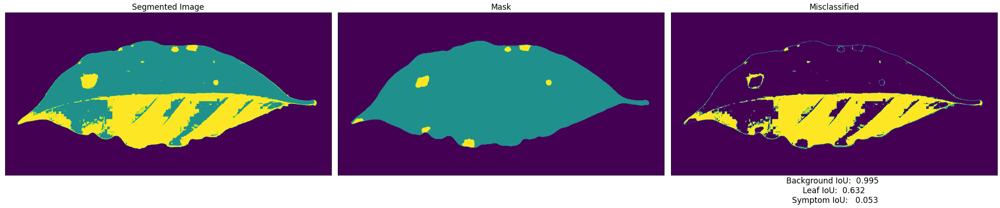

In [ ]:
a_masked_img = a_MaskGenerator(rgb_img, mask)
segmented_img, misclassified = GMM(a_masked_img, mask)
mask_1chnl = MaskEncoder(mask)

_, iou = ComputeIoU(segmented_img, mask_1chnl)
label = (
    f"Background IoU: {iou[0]: .3f} \n Leaf IoU: {iou[1]: .3f} \n Symptom IoU:  {iou[2]: .3f}"
    if len(iou) == 3
    else f"Background IoU: {iou[0]: .3f} \n Leaf IoU: {iou[1]: .3f}"
)

plt.figure(figsize=(30, 20))
custom_plotter(
    subplot_idx=131, img=segmented_img, title="Segmented Image", set_ticks=False
)
custom_plotter(subplot_idx=132, img=mask_1chnl, title="Mask", set_ticks=False)
custom_plotter(
    subplot_idx=133,
    img=misclassified,
    title="Misclassified",
    xlabel=label,
    set_ticks=False,
)

plt.tight_layout()

#### Visualizing Misclassified Segmentation Result


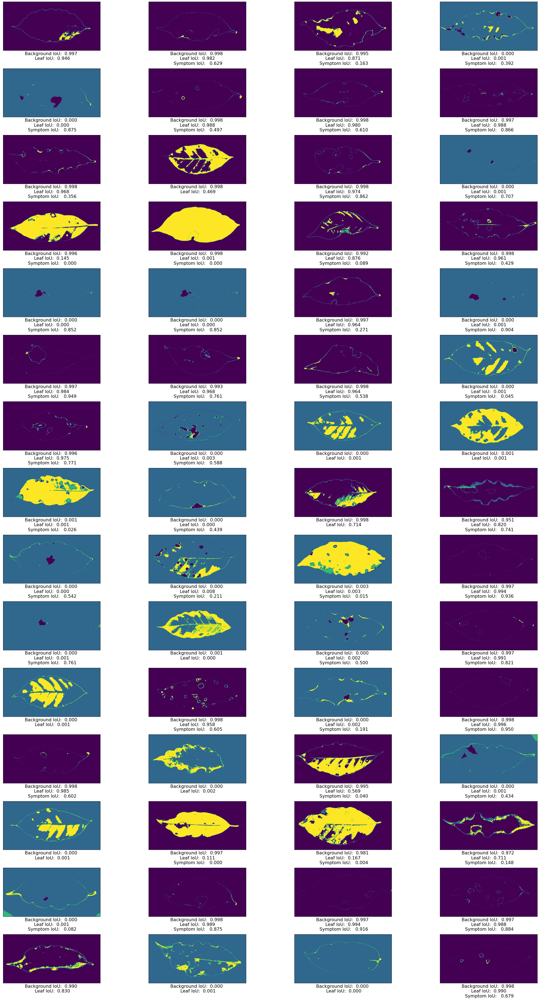

In [ ]:
fig = plt.figure(figsize=(30, 50))
gs = GridSpec(nrows=15, ncols=4)

for row in range(15):
    for clmn in range(4):
        _idx = randint(0, len(img_path_list))
        _img = cv2.imread(img_path_list[_idx])
        _mask = cv2.imread(mask_path_list[_idx])

        _mask_1chnl = MaskEncoder(_mask)
        _a_masked_img = a_MaskGenerator(cv2.cvtColor(_img, cv2.COLOR_BGR2RGB), _mask)
        _segmented_img, _misclassified_img = GMM(_a_masked_img, _mask)

        _, iou = ComputeIoU(_segmented_img, _mask_1chnl)
        label = (
            f"Background IoU: {iou[0]: .3f} \n Leaf IoU: {iou[1]: .3f} \n Symptom IoU:  {iou[2]: .3f}"
            if len(iou) == 3
            else f"Background IoU: {iou[0]: .3f} \n Leaf IoU: {iou[1]: .3f}"
        )

        ax = fig.add_subplot(gs[row, clmn])
        ax.imshow(_misclassified_img)
        ax.set_xlabel(label, size=16)
        ax.set(xticks=[], yticks=[])

gs.tight_layout(fig)